## Case study
A Card issuing Bank has over issued its cash and credit card in-order-to increase 
its market share, even to unqualified applicants. 
At the same time, most cardholders, irrespective of their repayment ability, 
overused credit card for consumption and accumulated heavy credit and cash– card debts. 
The crisis caused the blow to consumer finance confidence and it is a big challenge for both banks and cardholders. 
From the perspective of risk control, estimating the probability of default will be more meaningful than classifying customers into the binary results
– risky and non-risky.

In [1]:
# import lib

# Data manipulation lib
import pandas as pd
import numpy as np

# Data visualization lib
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as px
%matplotlib inline

# Data munging 

In [2]:
# import data
data=pd.read_excel(r'C:\Users\Atul\OneDrive\Desktop\Data_Clean\Default_Credit.xlsx')

In [3]:
data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,0,0,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,0,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,0,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:
del data['ID']

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   LIMIT_BAL                   30000 non-null  int64
 1   SEX                         30000 non-null  int64
 2   EDUCATION                   30000 non-null  int64
 3   MARRIAGE                    30000 non-null  int64
 4   AGE                         30000 non-null  int64
 5   PAY_0                       30000 non-null  int64
 6   PAY_2                       30000 non-null  int64
 7   PAY_3                       30000 non-null  int64
 8   PAY_4                       30000 non-null  int64
 9   PAY_5                       30000 non-null  int64
 10  PAY_6                       30000 non-null  int64
 11  BILL_AMT1                   30000 non-null  int64
 12  BILL_AMT2                   30000 non-null  int64
 13  BILL_AMT3                   30000 non-null  int64
 14  BILL_A

In [6]:
# checking for null values 
data.isnull().sum()

LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

In [7]:
# checking data for special charaters

# Analyzing Data

# Analyzing limit bal

data['LIMIT_BAL'].value_counts()

50000      3365
20000      1976
30000      1610
80000      1567
200000     1528
           ... 
730000        2
1000000       1
327680        1
760000        1
690000        1
Name: LIMIT_BAL, Length: 81, dtype: int64

In [8]:
data['LIMIT_BAL'].unique()

array([  20000,  120000,   90000,   50000,  500000,  100000,  140000,
        200000,  260000,  630000,   70000,  250000,  320000,  360000,
        180000,  130000,  450000,   60000,  230000,  160000,  280000,
         10000,   40000,  210000,  150000,  380000,  310000,  400000,
         80000,  290000,  340000,  300000,   30000,  240000,  470000,
        480000,  350000,  330000,  110000,  420000,  170000,  370000,
        270000,  220000,  190000,  510000,  460000,  440000,  410000,
        490000,  390000,  580000,  600000,  620000,  610000,  700000,
        670000,  680000,  430000,  550000,  540000, 1000000,  530000,
        710000,  560000,  520000,  750000,  640000,   16000,  570000,
        590000,  660000,  720000,  327680,  740000,  800000,  760000,
        690000,  650000,  780000,  730000], dtype=int64)

In [9]:
# Analyzing sex

data['SEX'].value_counts() # male - 1 & female - 2 ,  

2    18112
1    11888
Name: SEX, dtype: int64

In [10]:
data['SEX'].unique()

array([2, 1], dtype=int64)

In [11]:
# Analyzing education

#  Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)
#  From Education column  [5, 6, 0] have to replace with 4 - others 
data['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [12]:
# replacing unknow charaters with 4 - others
data['EDUCATION'] = data['EDUCATION'].replace(6, 4)
data['EDUCATION'] = data['EDUCATION'].replace(5, 4)
data['EDUCATION'] = data['EDUCATION'].replace(0, 4)

In [13]:
# Analyzing MARRIAGE - (1 = married; 2 = single; 3 = others)

data['MARRIAGE'].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [14]:
# replacing 0 with 3 - others 

data['MARRIAGE'] = data['MARRIAGE'].replace(0, 3)

In [15]:
# Analyzing AGE
data['AGE'].value_counts().head()

29    1605
27    1477
28    1409
30    1395
26    1256
Name: AGE, dtype: int64

In [16]:
data['AGE'].unique()

array([24, 26, 34, 37, 57, 29, 23, 28, 35, 51, 41, 30, 49, 39, 40, 27, 47,
       33, 32, 54, 58, 22, 25, 31, 46, 42, 43, 45, 56, 44, 53, 38, 63, 36,
       52, 48, 55, 60, 50, 75, 61, 73, 59, 21, 67, 66, 62, 70, 72, 64, 65,
       71, 69, 68, 79, 74], dtype=int64)

In [17]:
# Analyzing - The repayment status month wise

# Analyzing PAY_0
data['PAY_0'].value_counts()

0    23182
1     3688
2     2667
3      322
4       76
5       26
8       19
6       11
7        9
Name: PAY_0, dtype: int64

In [18]:
data['PAY_0'].unique()

array([2, 0, 1, 3, 4, 8, 7, 5, 6], dtype=int64)

In [19]:
# Analyzing PAY_2

data['PAY_2'].value_counts()

0    25562
2     3927
3      326
4       99
1       28
5       25
7       20
6       12
8        1
Name: PAY_2, dtype: int64

In [20]:
data['PAY_2'].unique()

array([2, 0, 3, 5, 7, 4, 1, 6, 8], dtype=int64)

In [21]:
# Analyzing PAY_3

data['PAY_3'].value_counts()

0    25787
2     3819
3      240
4       76
7       27
6       23
5       21
1        4
8        3
Name: PAY_3, dtype: int64

In [22]:
data['PAY_3'].unique()

array([0, 2, 3, 4, 6, 7, 1, 5, 8], dtype=int64)

In [23]:
# Analyzing PAY_4

data['PAY_4'].value_counts()

0    26490
2     3159
3      180
4       69
7       58
5       35
6        5
1        2
8        2
Name: PAY_4, dtype: int64

In [24]:
data['PAY_4'].unique()

array([0, 2, 3, 4, 5, 7, 6, 1, 8], dtype=int64)

In [25]:
# Analyzing PAY_5

data['PAY_5'].value_counts()

0    27032
2     2626
3      178
4       84
7       58
5       17
6        4
8        1
Name: PAY_5, dtype: int64

In [26]:
data['PAY_5'].unique()

array([0, 2, 3, 5, 4, 7, 8, 6], dtype=int64)

In [27]:
# Analyzing PAY_6

data['PAY_6'].value_counts()

0    26921
2     2766
3      184
4       49
7       46
6       19
5       13
8        2
Name: PAY_6, dtype: int64

In [28]:
data['PAY_6'].unique()

array([0, 2, 3, 6, 4, 7, 8, 5], dtype=int64)

In [29]:
# Analyzing bill Amount statement

# analyzing bill amt 1
data['BILL_AMT1'].value_counts()

0         2008
390        244
780         76
326         72
316         63
          ... 
11636        1
146034       1
20817        1
1351         1
47929        1
Name: BILL_AMT1, Length: 22723, dtype: int64

In [30]:
data['BILL_AMT1'].unique()

array([ 3913,  2682, 29239, ...,  1683, -1645, 47929], dtype=int64)

In [31]:
# analyzing bill amt 2
data['BILL_AMT2'].value_counts()

0        2506
390       231
326        75
780        75
316        72
         ... 
26357       1
85195       1
6889        1
11004       1
48905       1
Name: BILL_AMT2, Length: 22346, dtype: int64

In [32]:
data['BILL_AMT2'].unique()

array([ 3102,  1725, 14027, ...,  3356, 78379, 48905], dtype=int64)

In [33]:
# analyzing bill amt 3
data['BILL_AMT3'].value_counts()

0         2870
390        275
780         74
326         63
316         62
          ... 
19580        1
45129        1
227807       1
39330        1
49764        1
Name: BILL_AMT3, Length: 22026, dtype: int64

In [34]:
data['BILL_AMT3'].unique()

array([  689,  2682, 13559, ...,  2758, 76304, 49764], dtype=int64)

In [35]:
# analyzing bill amount 4
data['BILL_AMT4'].value_counts()

0         3195
390        246
780        101
316         68
326         62
          ... 
97189        1
118839       1
23567        1
18377        1
36535        1
Name: BILL_AMT4, Length: 21548, dtype: int64

In [36]:
data['BILL_AMT4'].unique()

array([    0,  3272, 14331, ..., 20878, 52774, 36535], dtype=int64)

In [37]:
# analyzing bill amt 5
data['BILL_AMT5'].value_counts()

0        3506
390       235
780        94
316        79
326        62
         ... 
19341       1
66726       1
80682       1
28508       1
32428       1
Name: BILL_AMT5, Length: 21010, dtype: int64

In [38]:
data['BILL_AMT5'].unique()

array([    0,  3455, 14948, ..., 31237,  5190, 32428], dtype=int64)

In [39]:
# analyzing bill amt 6
data['BILL_AMT6'].value_counts()

0         4020
390        207
780         86
150         78
316         77
          ... 
26852        1
108660       1
480          1
15298        1
15313        1
Name: BILL_AMT6, Length: 20604, dtype: int64

In [40]:
data['BILL_AMT6'].unique()

array([    0,  3261, 15549, ..., 19357, 48944, 15313], dtype=int64)

In [41]:
# analyzing previous pay amt

# analyzing pay_amt 1
data['PAY_AMT1'].value_counts()

0        5249
2000     1363
3000      891
5000      698
1500      507
         ... 
3391        1
7785        1
66022       1
10121       1
85900       1
Name: PAY_AMT1, Length: 7943, dtype: int64

In [42]:
data['PAY_AMT1'].unique()

array([    0,  1518,  2000, ..., 10029,  9054, 85900], dtype=int64)

In [43]:
# analyzing pay amt 2

data['PAY_AMT2'].value_counts()

0        5396
2000     1290
3000      857
5000      717
1000      594
         ... 
7866        1
6206        1
10529       1
21300       1
3526        1
Name: PAY_AMT2, Length: 7899, dtype: int64

In [44]:
data['PAY_AMT2'].unique()

array([   689,   1000,   1500, ...,   2977, 111784,   3526], dtype=int64)

In [45]:
# analyzing pay amt 3
data['PAY_AMT3'].value_counts()

0        5968
2000     1285
1000     1103
3000      870
5000      721
         ... 
5102        1
5368        1
28138       1
549         1
25128       1
Name: PAY_AMT3, Length: 7518, dtype: int64

In [46]:
data['PAY_AMT3'].unique()

array([     0,   1000,   1200, ..., 349395,   8907,  25128], dtype=int64)

In [47]:
# analyzing pay amt 4
data['PAY_AMT4'].value_counts()

0        6408
1000     1394
2000     1214
3000      887
5000      810
         ... 
18916       1
3468        1
11476       1
4363        1
8049        1
Name: PAY_AMT4, Length: 6937, dtype: int64

In [48]:
data['PAY_AMT4'].unique()

array([    0,  1000,  1100, ...,  2556, 10115,  8049], dtype=int64)

In [49]:
# analyzing pay amt 5

data['PAY_AMT5'].value_counts()

0        6703
1000     1340
2000     1323
3000      947
5000      814
         ... 
9111        1
16496       1
4819        1
10078       1
52964       1
Name: PAY_AMT5, Length: 6897, dtype: int64

In [50]:
data['PAY_AMT5'].unique()

array([    0,  1000,  1069, ...,  8040,  3319, 52964], dtype=int64)

In [51]:

#analyzing pay amt 6
data['PAY_AMT6'].value_counts()

0        7173
1000     1299
2000     1295
3000      914
5000      808
         ... 
7329        1
6862        1
6525        1
11894       1
16080       1
Name: PAY_AMT6, Length: 6939, dtype: int64

In [52]:
data['PAY_AMT6'].unique()

array([     0,   2000,   5000, ...,  70052, 220076,  16080], dtype=int64)

In [53]:
# analyzing defaulter column

# default payment, Y (Yes = 1, No = 0)

data['default payment next month'].value_counts()

0    23364
1     6636
Name: default payment next month, dtype: int64

# Data visualization

In [54]:
# Analyzing trend in Data

In [55]:
# filtering all defaulters in cust - 1
# filtering all non defaulters in cust - 0

cust1 = data[data['default payment next month']==1]
cust1.head()
cust0 = data[data['default payment next month']==0]
cust0.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,0,0,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
5,50000,1,1,2,37,0,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,0
6,500000,1,1,2,29,0,0,0,0,0,...,542653,483003,473944,55000,40000,38000,20239,13750,13770,0


<AxesSubplot:xlabel='default payment next month', ylabel='LIMIT_BAL'>

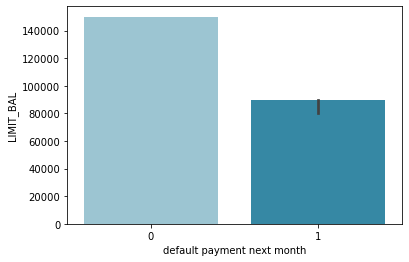

In [56]:
#Analyzing Limit_bal and defaulter value

sns.set_palette('ocean_r')
sns.barplot(data=data,x='default payment next month',y='LIMIT_BAL',estimator=np.median)

- Most of the customers are non defaulters

In [57]:
# Analyzing sex and defaulter column

<AxesSubplot:xlabel='SEX', ylabel='count'>

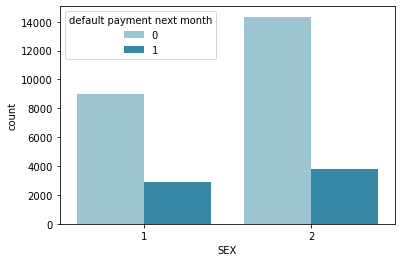

In [58]:
sns.set_palette('ocean_r')
sns.countplot(data = data, x='SEX',  hue ='default payment next month')

- Womens are default more then man
- Womens are also paybill on time (womens are also high in count of non-defaulter ) 
- Overall more women are issued credit card than men

- No relationship between sex and default payment next month

<AxesSubplot:xlabel='EDUCATION', ylabel='count'>

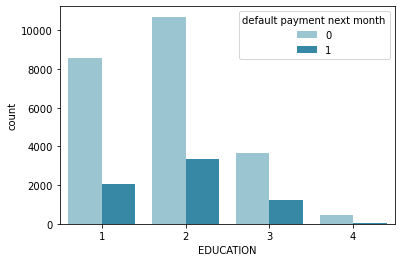

In [59]:
# analyzing education and default column
sns.set_palette('ocean_r')
sns.countplot(data= data, x='EDUCATION', hue = 'default payment next month')

- University students are higher defaulters & also paying bills on time
- Again No relationship b/w education and defaulters

In [60]:
# analyzing marriage and default column

<AxesSubplot:xlabel='MARRIAGE', ylabel='count'>

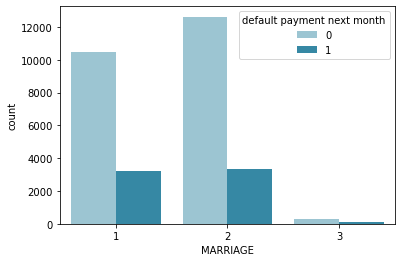

In [61]:
sns.set_palette('ocean_r')
sns.countplot(data = data, x='MARRIAGE', hue = 'default payment next month')

- Again people who are single default more and also pay on time
- No relationship b/w marriage and defaulters

In [62]:
# analyzing age and defaulters columns

<AxesSubplot:xlabel='default payment next month', ylabel='AGE'>

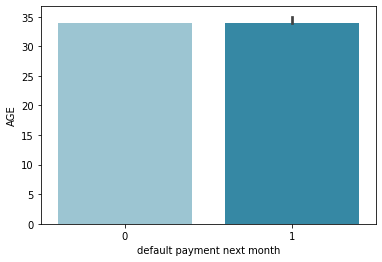

In [63]:
sns.set_palette('ocean_r')
sns.barplot(data = data, x='default payment next month', y = 'AGE', estimator = np.median)

- Average age of defaulter and non defaulter is same

- No obvious relationship between AGE and default payment next month

In [64]:
# analyzing pay_0 and defaulters columns

<AxesSubplot:xlabel='PAY_0', ylabel='count'>

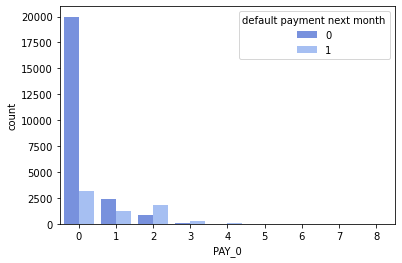

In [65]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_0', hue = 'default payment next month')

<AxesSubplot:xlabel='PAY_2', ylabel='count'>

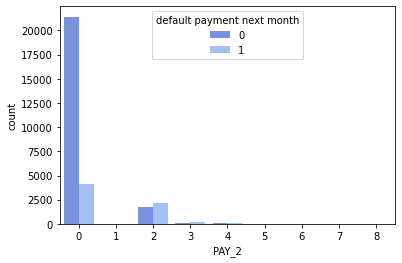

In [66]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_2', hue = 'default payment next month')

<AxesSubplot:xlabel='PAY_3', ylabel='count'>

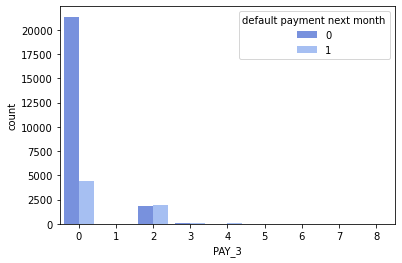

In [67]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_3', hue = 'default payment next month')

<AxesSubplot:xlabel='PAY_4', ylabel='count'>

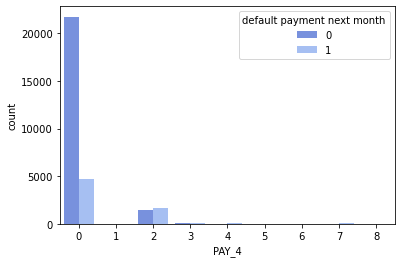

In [68]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_4', hue = 'default payment next month')

<AxesSubplot:xlabel='PAY_5', ylabel='count'>

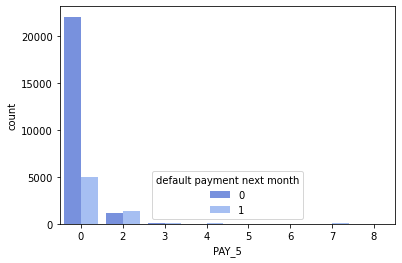

In [69]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_5', hue = 'default payment next month')

<AxesSubplot:xlabel='PAY_6', ylabel='count'>

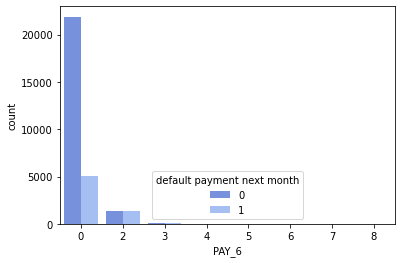

In [70]:
sns.set_palette('coolwarm')
sns.countplot(data = data, x ='PAY_6', hue = 'default payment next month')

- Most of the customers pay there bills on time
- Others who delays payment usually do not repay mostly  for 1- 2 months

In [71]:
# Analyzing bill amount and default customers

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT1'>

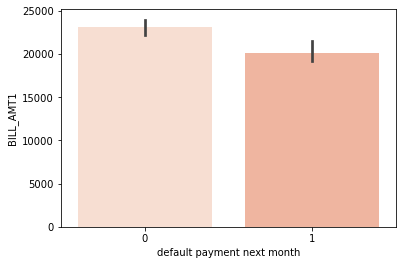

In [72]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT1' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT2'>

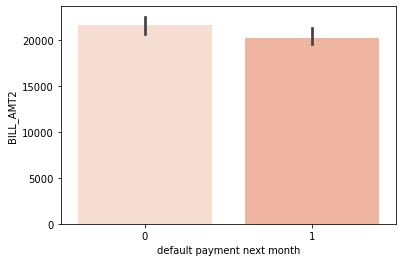

In [73]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT2' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT3'>

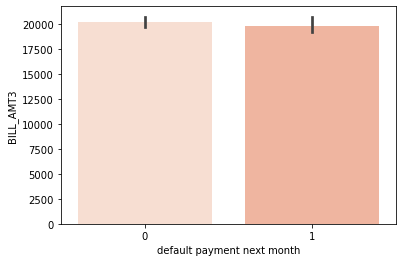

In [74]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT3' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT4'>

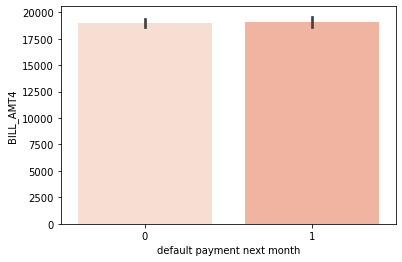

In [75]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT4' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT5'>

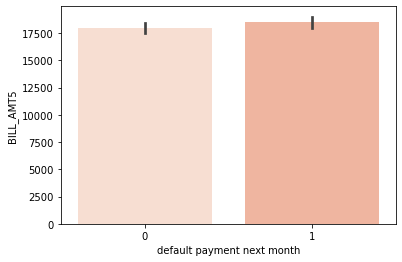

In [76]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT5' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT6'>

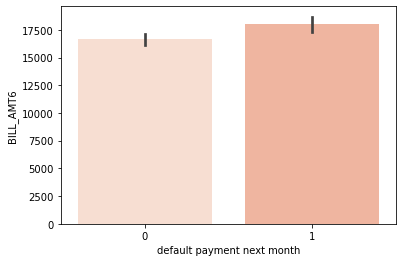

In [77]:
sns.set_palette('Reds')
sns.barplot(data = data, x = 'default payment next month', y = 'BILL_AMT6' , estimator = np.median)

- For some months bill amount for non defaulter are higher, 
- For some months lower, 
- And for some months equals to non - defaulters

In [78]:
# analyzing payment and defaulters

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT1'>

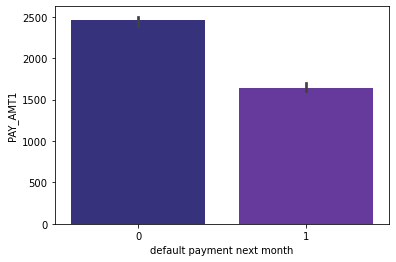

In [79]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT1' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT2'>

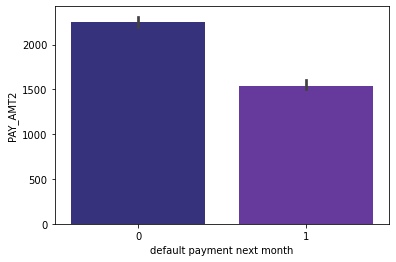

In [80]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT2' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT3'>

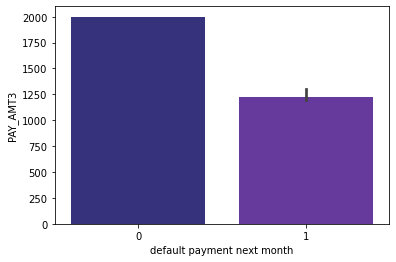

In [81]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT3' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT4'>

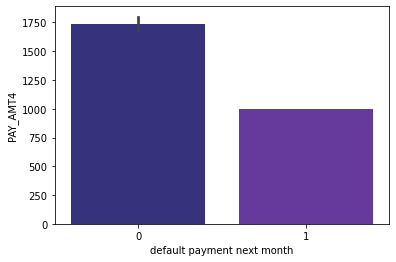

In [82]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT4' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT5'>

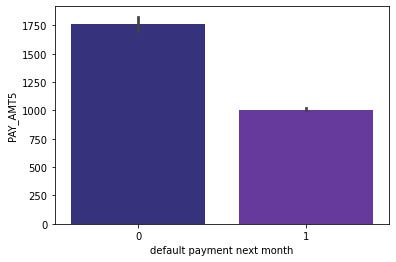

In [83]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT5' , estimator = np.median)

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT6'>

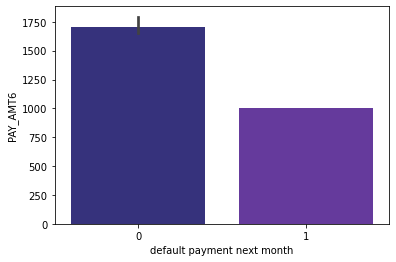

In [84]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x = 'default payment next month', y = 'PAY_AMT6' , estimator = np.median)

- The average pay amount of defaulters are very less than non defaulters
- Minimum due payment also not made by defaulter

# Number of customer with outstanding amount (In different outstanding buket)

In [85]:
#Analyzing bill amount for the month of September

In [86]:
cut_labels=['No Dues','1-25000','25000-50000','50000-100000','100000-200000','200000-300000','300000-400000','400000-500000','500000-600000','600000-700000','700000-800000','800000-900000']
cut_bins=[-16000,0,25000,50000,100000,200000,300000,400000,500000,600000,700000,800000,900000]
data['Outstanding Amount for September']=pd.cut(data['BILL_AMT1'],bins=cut_bins,labels=cut_labels)

In [87]:
# checking for all customers

In [88]:
data.groupby('Outstanding Amount for September').BILL_AMT1.count()

Outstanding Amount for September
No Dues           2596
1-25000          12965
25000-50000       4931
50000-100000      4600
100000-200000     3383
200000-300000     1033
300000-400000      315
400000-500000      130
500000-600000       35
600000-700000        8
700000-800000        1
800000-900000        0
Name: BILL_AMT1, dtype: int64

<AxesSubplot:xlabel='Outstanding Amount for September'>

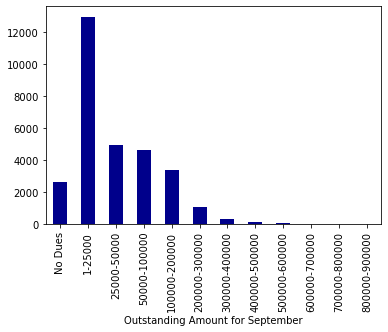

In [89]:
data.groupby('Outstanding Amount for September').BILL_AMT1.count().plot(kind = 'bar', color = 'darkblue')

In [90]:
# checking for defaulters and non defaulter

In [91]:
# defaulters
cust1 = data[data['default payment next month']==1]

In [92]:
# non defaulter
cust0 = data[data['default payment next month']==0]

<AxesSubplot:xlabel='Outstanding Amount for September'>

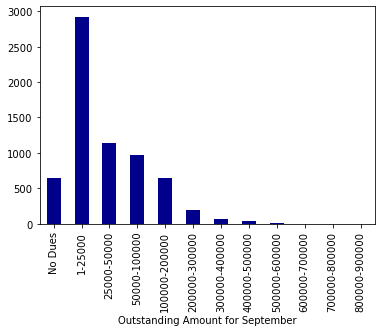

In [93]:
cust1.groupby('Outstanding Amount for September').BILL_AMT1.count().plot(kind = 'bar', color = 'darkblue')

<AxesSubplot:xlabel='Outstanding Amount for September'>

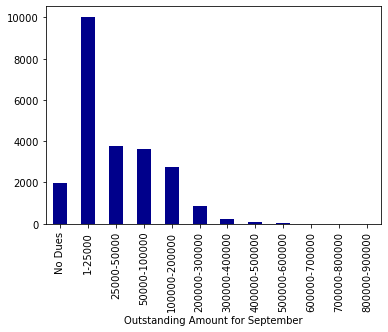

In [94]:
cust0.groupby('Outstanding Amount for September').BILL_AMT1.count().plot(kind = 'bar', color = 'darkblue')

- Insights-Majority of the customers have an outstanding balance between 1-25000
- Irresepective of being a defaulter or not,outstanding balance of most customers ranges between 1-25000 in September

## Age of Outstanding Amount Analysis¶

<AxesSubplot:xlabel='PAY_0'>

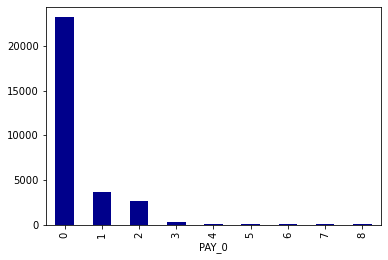

In [95]:
data.groupby('PAY_0').BILL_AMT1.count().plot(kind='bar',color='darkblue')

- Majority of the outsranding amount has been paid on time
- Apart from them most of the outanding amounts have not been paid for 1-2 months

## Analyzing relationship between Outstanding Amount / trend with respect to Age, Education, Marriage, Credit Limit

In [96]:
fig = px.scatter(data, x='AGE', y ='BILL_AMT1',trendline= 'ols' )
fig.show()

- No obivous relationship b\w age & bill amt

In [97]:
# Analyzing BILL Amount and Education 

<AxesSubplot:xlabel='EDUCATION', ylabel='BILL_AMT1'>

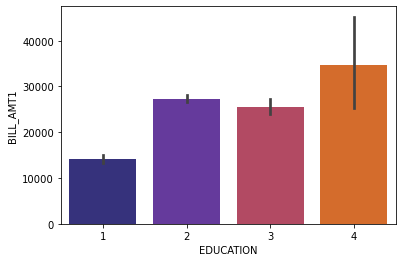

In [98]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x='EDUCATION', y = 'BILL_AMT1', estimator = np.median)

- Be it defaulter or not people from graduate schools have less average outstanding balances
- Be it defaulter or not people from other education backgrounds have high average outstanding balances

In [99]:
# Analyzing bill amount with marriage

<AxesSubplot:xlabel='MARRIAGE', ylabel='BILL_AMT1'>

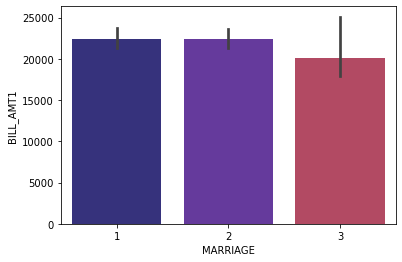

In [100]:
sns.set_palette('CMRmap')
sns.barplot(data = data, x='MARRIAGE', y='BILL_AMT1', estimator = np.median)

<AxesSubplot:xlabel='MARRIAGE', ylabel='BILL_AMT1'>

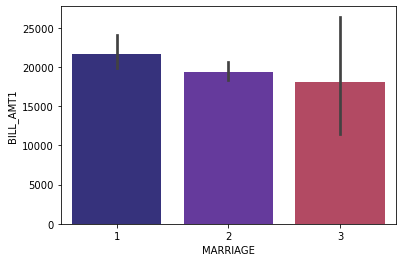

In [101]:
# defaulters
sns.set_palette('CMRmap')
sns.barplot(data = cust1, x='MARRIAGE', y='BILL_AMT1', estimator = np.median)

<AxesSubplot:xlabel='MARRIAGE', ylabel='BILL_AMT1'>

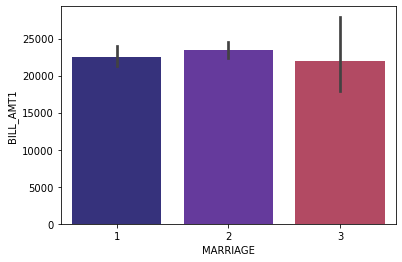

In [102]:
# non defaulters
sns.set_palette('CMRmap')
sns.barplot(data = cust0, x='MARRIAGE', y='BILL_AMT1', estimator = np.median)

- In defaulters,married people have high outstanding balances
- In non defaulters single people and married people have almost the same average outsanding balances

In [103]:
#Analyzing outstanding amount and credit limit

In [104]:
fig = px.scatter(data, x='LIMIT_BAL', y ='BILL_AMT1',trendline= 'ols' )
fig.show()

- Outstanding amount increases as credit limit increases

## Does Outstanding Amount / trend affect the default behavior in next month¶

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT1'>

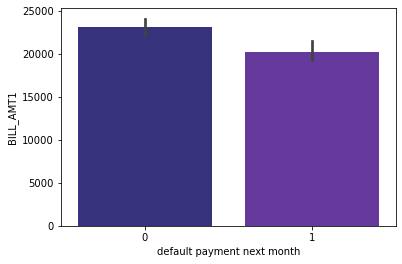

In [105]:
#Analyzing bill amount and default behaviour
sns.set_palette('CMRmap')
sns.barplot(data=data,x='default payment next month',y='BILL_AMT1',estimator=np.median)

- Average Outstanding amounts for defaulters are usually less than average outstanding amount for non defaulters

## Checking for Normal Distribution of important columns and providing valuable insights from the visualization

In [106]:
#It is seen that LIMIT_BAL,BILL_AMT1 and PAY_AMT1 significantly help us differentiate b/w a defaulter and non defaulter
#So checking normalization for these 3 columns

In [107]:
#Checking normalization for LIMIT_BAL

<AxesSubplot:xlabel='LIMIT_BAL', ylabel='Count'>

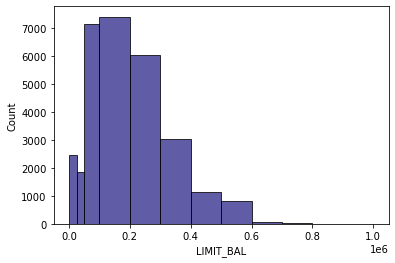

In [108]:
sns.set_palette('CMRmap')
sns.histplot(data['LIMIT_BAL'],bins=[0,25000,50000,100000,200000,300000,400000,500000,600000,700000,800000,900000,1000000])

- Data is positively skewed and not normally distributed
- It means there are extreme values present in the data set(mean>median)
- MOST people have a credit limit ranging between 50000-200000

In [109]:
data['LIMIT_BAL'].skew()

0.992866960519544

In [110]:
data['LIMIT_BAL'].kurt()

0.536262896398668

<AxesSubplot:xlabel='BILL_AMT1', ylabel='Count'>

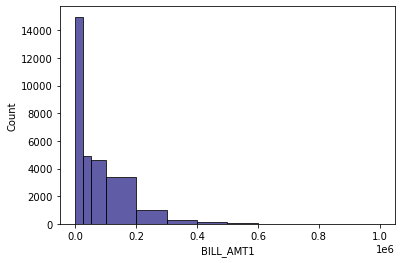

In [111]:
sns.set_palette('CMRmap')
sns.histplot(data['BILL_AMT1'],bins=[0,25000,50000,100000,200000,300000,400000,500000,600000,700000,800000,900000,1000000])

- Data is positively skewed
- It means there are extreme values present in the data set(mean>median)
- MOST people have a bill amounts ranging between 0-200000
- For each months overpaid amount is more (Overpaid in the form of negative balance in your acount)

In [112]:
data['BILL_AMT1'].skew()

2.6638610220232612

In [113]:
data['BILL_AMT1'].kurt()

9.806289341330837

- Credit limit has broader ranges(3 or more std devs from the mean)
- Therefore more potential for outliers

In [114]:
#Now checking for pay amount

<AxesSubplot:xlabel='PAY_AMT1', ylabel='Count'>

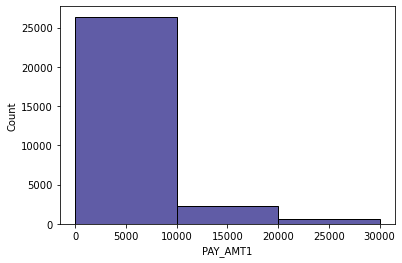

In [115]:
sns.set_palette('CMRmap')
sns.histplot(data['PAY_AMT1'],bins=[0, 10000, 20000, 30000])

- Data is positively skewed
- It means there are extreme values present in the data set
- MOST people have PAY amounts ranging between 0-10000

## Checking for outliers and guessing the reason behind outliers and
## Checking whether they are worthy to have it in our dataset or not required

In [116]:
#Checking for outliers in the important colums:LIMIT_BAL,BILL_AMT1 and PAY_AMT1

<AxesSubplot:xlabel='default payment next month', ylabel='LIMIT_BAL'>

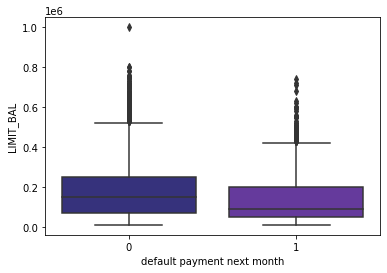

In [117]:
sns.set_palette('CMRmap')
sns.boxplot(x=data['default payment next month'],y=data['LIMIT_BAL'])

In [118]:
#Reason behind higher credit limits means a customer has good income and credit history
#And most of the customers here are non defaulters
#So they can be kept in our datset

In [119]:
#If we check outliers most of them are non defaulters
#Good to keep them in the dataset as they are good customers and they usually do not default

<AxesSubplot:xlabel='default payment next month', ylabel='BILL_AMT1'>

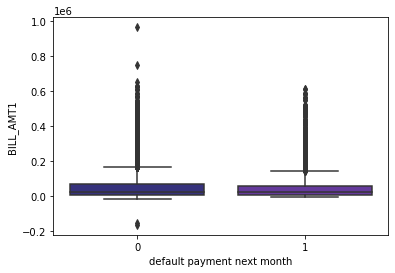

In [120]:
# analyzing bill amount
sns.set_palette('CMRmap')
sns.boxplot(x=data['default payment next month'],y=data['BILL_AMT1'])

In [121]:
q3,q1=np.percentile(data['BILL_AMT1'],[75,25])
iqr=q3-q1
iqr

63532.25

In [122]:
#If we check outliers most of them are non defaulters
#Good to keep them in the dataset as they are good customers and they usually do not default

In [123]:
#Analyzing PAY_AMT1

<AxesSubplot:xlabel='default payment next month', ylabel='PAY_AMT1'>

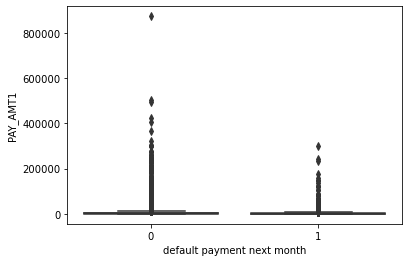

In [124]:
sns.set_palette('CMRmap')
sns.boxplot(x=data['default payment next month'],y=data['PAY_AMT1'])

- High pay amounts means higher probability of being a non defaulter(Even if it is over due)
- So can be kept in our dataset

- So it can be seen that customers with high credit limit and high pay amounts are usually non defaulters
- However we are intersested in reducing the outstanding amounts but we need to increse pay amounts to reduce losses

In [125]:
#Analysed the patterns between defaulters and non defaulters and found that customers with high average CREDIT LIMIT and...
#..higher PAY AMOUNTS each month are most likely to be non defaulters.

In [126]:
#Analyzing bill amounts and pay amounts using K Means Clustering

In [127]:
#Selecting The bill amount of September and the payment amount in September

x=data.iloc[:,[12,18]].values

In [128]:
x

array([[ 3102,   689],
       [ 1725,  1000],
       [14027,  1500],
       ...,
       [ 3356,     0],
       [78379,  3409],
       [48905,  1800]], dtype=int64)

In [129]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(1,11):  #Creating 10 clusters for now to check where we get the elbow joint
    Kmeans=KMeans(n_clusters=i,init='k-means++') #Iterating on i as it ranges from 1 to 10,init initialises the centroid(generates a random centroid where points density is more)
    Kmeans.fit(x)
    wcss.append(Kmeans.inertia_)#helps find euclidean distance

In [130]:
wcss

[167892015560723.62,
 66617859131522.17,
 41811085478102.445,
 30709344268022.26,
 24229423688262.273,
 19079324750676.76,
 14268391124955.625,
 11484571695819.465,
 9758375922718.715,
 8458013443403.543]

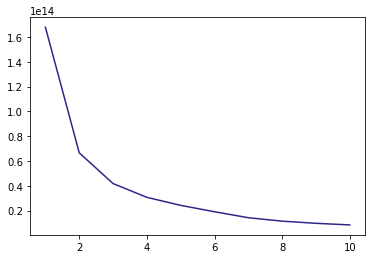

In [131]:
plt.plot(range(1,11),wcss)

In [132]:
#At cluster no 3 we get the elbow joint as after that very less change in euclidean distance

In [133]:
#Creating 3 clusters

Kmeans=KMeans(n_clusters=3,init='k-means++')
y_kmeans=Kmeans.fit_predict(x)
y_kmeans
#WE get cluster number for each customer

array([1, 1, 1, ..., 1, 0, 1])

In [134]:
#To get a view of the cluster number and dataset together

pd.concat([data, pd.DataFrame(y_kmeans)],axis=1)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,Outstanding Amount for September,0
0,20000,2,2,1,24,2,2,0,0,0,...,0,0,689,0,0,0,0,1,1-25000,1
1,120000,2,2,2,26,0,2,0,0,0,...,3261,0,1000,1000,1000,0,2000,1,1-25000,1
2,90000,2,2,2,34,0,0,0,0,0,...,15549,1518,1500,1000,1000,1000,5000,0,25000-50000,1
3,50000,2,2,1,37,0,0,0,0,0,...,29547,2000,2019,1200,1100,1069,1000,0,25000-50000,1
4,50000,1,2,1,57,0,0,0,0,0,...,19131,2000,36681,10000,9000,689,679,0,1-25000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,15980,8500,20000,5003,3047,5000,1000,0,100000-200000,0
29996,150000,1,3,2,43,0,0,0,0,0,...,0,1837,3526,8998,129,0,0,0,1-25000,1
29997,30000,1,2,2,37,4,3,2,0,0,...,19357,0,0,22000,4200,2000,3100,1,1-25000,1
29998,80000,1,3,1,41,1,0,0,0,0,...,48944,85900,3409,1178,1926,52964,1804,1,No Dues,0


In [135]:
# creating cluster column in dataset
data['Cluster'] = pd.DataFrame(y_kmeans)

Text(0.5, 1.0, 'Comparing Bill Amount and Pay Amount')

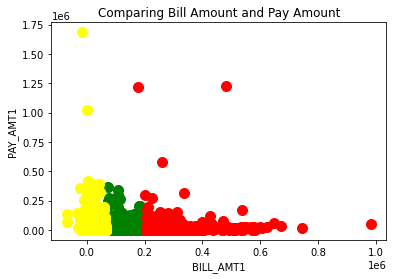

In [136]:
#Plotting for seeing diff clusters

plt.scatter(x[y_kmeans==0,0],x[y_kmeans==0,1],s=100,c='green')
#Checking for cluster 1(where y_kmeans=0 ..here 0and 1 refer to columns BILL_AMT1 and PAY_AMT1 respectively)

#Similarly for other clusters

plt.scatter(x[y_kmeans==1,0],x[y_kmeans==1,1],s=100,c='yellow')
plt.scatter(x[y_kmeans==2,0],x[y_kmeans==2,1],s=100,c='red')
plt.xlabel('BILL_AMT1')
plt.ylabel('PAY_AMT1')
plt.title('Comparing Bill Amount and Pay Amount')

In [137]:
#Customers to follow up are the customers belonging to cluster 2 i.e red cluster
#These customers have high bill amounts and low pay amounts

alert=data[data['Cluster']==2]

In [138]:
alert.shape

(1320, 26)

In [139]:
#Customers who are highly safe are the customers in cluster 0 i.e yellow cluster
#These customers have low bill amounts and high pay amounts

In [140]:
highly_safe=data[data['Cluster']==1]

In [141]:
highly_safe.shape

(22759, 26)

In [142]:
#cluster 1 greeen, These customers average bill amounts and average pay amounts

In [143]:
safe=data[data['Cluster']==0]

In [144]:
safe.shape

(5921, 26)

- The deliverable is to reduce losses so Customers of red cluster(cluster red ...classified as alert)
- Have to be followed up to make sure they pay on time to reduce losses

In [145]:
data

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,Outstanding Amount for September,Cluster
0,20000,2,2,1,24,2,2,0,0,0,...,0,0,689,0,0,0,0,1,1-25000,1
1,120000,2,2,2,26,0,2,0,0,0,...,3261,0,1000,1000,1000,0,2000,1,1-25000,1
2,90000,2,2,2,34,0,0,0,0,0,...,15549,1518,1500,1000,1000,1000,5000,0,25000-50000,1
3,50000,2,2,1,37,0,0,0,0,0,...,29547,2000,2019,1200,1100,1069,1000,0,25000-50000,1
4,50000,1,2,1,57,0,0,0,0,0,...,19131,2000,36681,10000,9000,689,679,0,1-25000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,15980,8500,20000,5003,3047,5000,1000,0,100000-200000,0
29996,150000,1,3,2,43,0,0,0,0,0,...,0,1837,3526,8998,129,0,0,0,1-25000,1
29997,30000,1,2,2,37,4,3,2,0,0,...,19357,0,0,22000,4200,2000,3100,1,1-25000,1
29998,80000,1,3,1,41,1,0,0,0,0,...,48944,85900,3409,1178,1926,52964,1804,1,No Dues,0


In [146]:
data['Cluster'].value_counts()

1    22759
0     5921
2     1320
Name: Cluster, dtype: int64

In [147]:
#Analyzing credit limit and pay amount as credit limit is a parameter that helps...
#...distinguish between a defaulter and non defaulter 

In [148]:
#Selecting The limit balance and the payment amount in September

x=data.iloc[:,[0,18]].values

In [149]:
x

array([[ 20000,    689],
       [120000,   1000],
       [ 90000,   1500],
       ...,
       [ 30000,      0],
       [ 80000,   3409],
       [ 50000,   1800]], dtype=int64)

In [150]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(1,11):  #Creating 10 clusters for now to check where we get the elbow joint
    Kmeans=KMeans(n_clusters=i,init='k-means++') #Iterating on i as it ranges from 1 to 10,init initialises the centroid(generates a random centroid where points density is more)
    Kmeans.fit(x)
    wcss.append(Kmeans.inertia_)#helps find euclidean distance

In [151]:
wcss

[520942756393857.25,
 173035236837499.38,
 83155193229240.31,
 55010618800261.734,
 40754182163777.766,
 33746980672797.137,
 27552173534153.98,
 22323143838993.145,
 18841291205102.887,
 15857910671025.99]

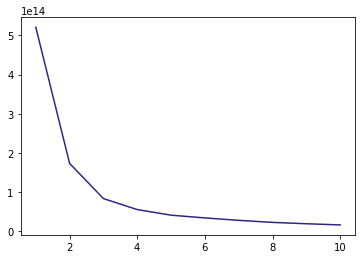

In [152]:
#Plotting elbow chart

plt.plot(range(1,11),wcss)

In [153]:
#Creating 3 clusters

Kmeans=KMeans(n_clusters=3,init='k-means++')
y_kmeans=Kmeans.fit_predict(x)
y_kmeans
#WE get cluster number for each customer

array([1, 1, 1, ..., 1, 1, 1])

In [154]:
#To get a view of the cluster number and dataset together

pd.concat([data,pd.DataFrame(y_kmeans)],axis=1)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,Outstanding Amount for September,Cluster,0
0,20000,2,2,1,24,2,2,0,0,0,...,0,689,0,0,0,0,1,1-25000,1,1
1,120000,2,2,2,26,0,2,0,0,0,...,0,1000,1000,1000,0,2000,1,1-25000,1,1
2,90000,2,2,2,34,0,0,0,0,0,...,1518,1500,1000,1000,1000,5000,0,25000-50000,1,1
3,50000,2,2,1,37,0,0,0,0,0,...,2000,2019,1200,1100,1069,1000,0,25000-50000,1,1
4,50000,1,2,1,57,0,0,0,0,0,...,2000,36681,10000,9000,689,679,0,1-25000,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,8500,20000,5003,3047,5000,1000,0,100000-200000,0,0
29996,150000,1,3,2,43,0,0,0,0,0,...,1837,3526,8998,129,0,0,0,1-25000,1,0
29997,30000,1,2,2,37,4,3,2,0,0,...,0,0,22000,4200,2000,3100,1,1-25000,1,1
29998,80000,1,3,1,41,1,0,0,0,0,...,85900,3409,1178,1926,52964,1804,1,No Dues,0,1


Text(0.5, 1.0, 'Comparing Credit Limit and Pay Amount')

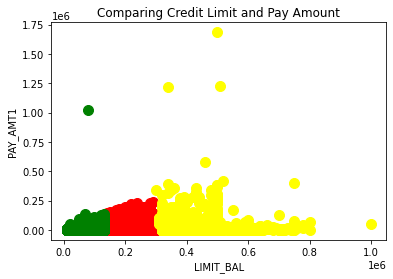

In [155]:
#Plotting for seeing diff clusters

plt.scatter(x[y_kmeans==0,0],x[y_kmeans==0,1],s=100,c='red')
#Checking for cluster 1(where y_kmeans=0 ..here 0and 1 refer to columns BILL_AMT1 and PAY_AMT1 respectively)

#Similarly for other clusters

plt.scatter(x[y_kmeans==1,0],x[y_kmeans==1,1],s=100,c='green')
plt.scatter(x[y_kmeans==2,0],x[y_kmeans==2,1],s=100,c='yellow')
plt.scatter(x[y_kmeans==3,0],x[y_kmeans==3,1],s=100,c='black')
plt.xlabel('LIMIT_BAL')
plt.ylabel('PAY_AMT1')
plt.title('Comparing Credit Limit and Pay Amount')

In [156]:
#Creating 5 clusters

Kmeans=KMeans(n_clusters=5,init='k-means++')
y_kmeans=Kmeans.fit_predict(x)
y_kmeans
#WE get cluster number for each customer

array([0, 2, 0, ..., 0, 0, 0])

In [157]:

pd.concat([data,pd.DataFrame(y_kmeans)],axis=1)

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,Outstanding Amount for September,Cluster,0
0,20000,2,2,1,24,2,2,0,0,0,...,0,689,0,0,0,0,1,1-25000,1,0
1,120000,2,2,2,26,0,2,0,0,0,...,0,1000,1000,1000,0,2000,1,1-25000,1,2
2,90000,2,2,2,34,0,0,0,0,0,...,1518,1500,1000,1000,1000,5000,0,25000-50000,1,0
3,50000,2,2,1,37,0,0,0,0,0,...,2000,2019,1200,1100,1069,1000,0,25000-50000,1,0
4,50000,1,2,1,57,0,0,0,0,0,...,2000,36681,10000,9000,689,679,0,1-25000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,8500,20000,5003,3047,5000,1000,0,100000-200000,0,4
29996,150000,1,3,2,43,0,0,0,0,0,...,1837,3526,8998,129,0,0,0,1-25000,1,2
29997,30000,1,2,2,37,4,3,2,0,0,...,0,0,22000,4200,2000,3100,1,1-25000,1,0
29998,80000,1,3,1,41,1,0,0,0,0,...,85900,3409,1178,1926,52964,1804,1,No Dues,0,0


Text(0.5, 1.0, 'Comparing Credit Limit and Pay Amount')

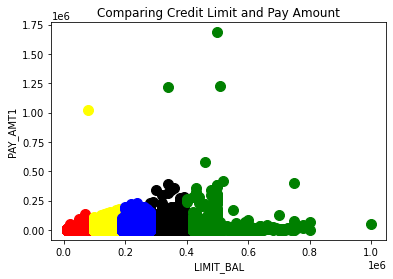

In [158]:
#Plotting for seeing diff clusters

plt.scatter(x[y_kmeans==0,0],x[y_kmeans==0,1],s=100,c='red')
#Checking for cluster 1(where y_kmeans=0 ..here 0and 1 refer to columns BILL_AMT1 and PAY_AMT1 respectively)

#Similarly for other clusters

plt.scatter(x[y_kmeans==1,0],x[y_kmeans==1,1],s=100,c='black')
plt.scatter(x[y_kmeans==2,0],x[y_kmeans==2,1],s=100,c='yellow')
plt.scatter(x[y_kmeans==3,0],x[y_kmeans==3,1],s=100,c='green')
plt.scatter(x[y_kmeans==4,0],x[y_kmeans==4,1],s=100,c='blue')
plt.xticks(visible='True')
plt.xlabel('LIMIT_BAL')
plt.ylabel('PAY_AMT1')
plt.title('Comparing Credit Limit and Pay Amount')

- Customers with credit limit between 1.5L to 4.5 L have paid higher pay amounts(black  and green clusters)
